In [60]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
from sklearn import metrics
import datetime as datetime
from sklearn.preprocessing import LabelEncoder
from ydata_profiling import ProfileReport
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
from sklearn.preprocessing import PolynomialFeatures
import plotly.express as px
%matplotlib inline

In [2]:
data = pd.read_csv("5G_energy_consumption_dataset.csv")

In [3]:
data.head(10)

,Time,BS,Energy,load,ESMODE,TXpower
0,20230101 010000,B_0,64.275037,0.487936,0.0,7.101719
1,20230101 020000,B_0,55.904335,0.344468,0.0,7.101719
2,20230101 030000,B_0,57.698057,0.193766,0.0,7.101719
3,20230101 040000,B_0,55.156951,0.222383,0.0,7.101719
4,20230101 050000,B_0,56.053812,0.175436,0.0,7.101719
5,20230101 070000,B_0,82.959641,0.351585,0.0,7.101719
6,20230101 080000,B_0,91.031390,0.759298,0.0,7.101719
7,20230101 090000,B_0,78.176383,0.887798,0.0,7.101719
8,20230101 100000,B_0,72.645740,0.624745,0.0,7.101719
9,20230101 140000,B_0,66.666667,0.437926,0.0,7.101719


In [4]:
data["Time"] = pd.to_datetime(data["Time"], format="%Y%m%d %H%M%S")

In [5]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 92629 entries, 0 to 92628
Data columns (total 6 columns):
 #   Column   Non-Null Count  Dtype         
---  ------   --------------  -----         
 0   Time     92629 non-null  datetime64[ns]
 1   BS       92629 non-null  object        
 2   Energy   92629 non-null  float64       
 3   load     92629 non-null  float64       
 4   ESMODE   92629 non-null  float64       
 5   TXpower  92629 non-null  float64       
dtypes: datetime64[ns](1), float64(4), object(1)
memory usage: 4.2+ MB


In [6]:
encoder = LabelEncoder()
data["BS"] = encoder.fit_transform(data["BS"])

In [7]:
data.head()

,Time,BS,Energy,load,ESMODE,TXpower
0,2023-01-01 01:00:00,0,64.275037,0.487936,0.0,7.101719
1,2023-01-01 02:00:00,0,55.904335,0.344468,0.0,7.101719
2,2023-01-01 03:00:00,0,57.698057,0.193766,0.0,7.101719
3,2023-01-01 04:00:00,0,55.156951,0.222383,0.0,7.101719
4,2023-01-01 05:00:00,0,56.053812,0.175436,0.0,7.101719


In [8]:
data.describe()

,Time,BS,Energy,load,ESMODE,TXpower
count,92629,92629.000000,92629.000000,92629.000000,92629.000000,92629.000000
mean,2023-01-04 00:31:21.324423424,423.585907,28.138997,0.244705,0.081361,6.765427
min,2023-01-01 01:00:00,0.000000,0.747384,0.000000,0.000000,5.381166
25%,2023-01-02 11:00:00,213.000000,18.236173,0.057370,0.000000,6.427504
50%,2023-01-03 20:00:00,423.000000,24.065770,0.165550,0.000000,6.875934
75%,2023-01-05 14:00:00,629.000000,35.724963,0.363766,0.000000,6.875934
max,2023-01-08 00:00:00,922.000000,100.000000,0.993957,4.000000,8.375336
std,NaN,244.022127,13.934645,0.234677,0.382317,0.309929


In [9]:
#Inspect the dataset for potential missing values
data.isnull().sum()

Time       0
BS         0
Energy     0
load       0
ESMODE     0
TXpower    0
dtype: int64

In [10]:
#Inspect the dataset for potential missing values.(or)
missing_values = data.columns[data.isnull().any()]
missing_values

Index([], dtype='object')

In [11]:
#checking for duplicates
duplicates = data.duplicated()
# Display the duplicated rows
duplicated_rows = data[duplicates]
print(duplicated_rows)

Empty DataFrame
Columns: [Time, BS, Energy, load, ESMODE, TXpower]
Index: []


In [12]:
# Generate the profile report
profile = ProfileReport(data, title='5G-Energy consumption')
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [13]:
sns.scatterplot(x = "load" , y = "Energy" , data = data)
plt.show()

C:\Users\ad\AppData\Local\Temp\ipykernel_14856\696675156.py:2: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  plt.show()


In [14]:
sns.scatterplot(x = "TXpower" , y = "Energy" , data = data)
plt.show()

C:\Users\ad\AppData\Local\Temp\ipykernel_14856\108636183.py:2: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  plt.show()


In [15]:
# Example: Scatter plot for 'Energy' against 'TXpower' for a specific range
sns.scatterplot(x='TXpower', y='Energy', data=data[data['TXpower'] < 7])
plt.show()


C:\Users\ad\AppData\Local\Temp\ipykernel_14856\919237632.py:3: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  plt.show()


In [16]:
sns.scatterplot(x = "TXpower" , y = "load" , data = data)
plt.show()

C:\Users\ad\AppData\Local\Temp\ipykernel_14856\3247400003.py:2: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  plt.show()


In [17]:
#Handling Skewness of Energy using Transformations:
data['Energy'] = np.log1p(data['Energy'])

In [18]:
#Handling Skewness of load using Transformations:
data['load'] = np.log1p(data['load'])

In [19]:
#Handling Skewness of ESMODE using Transformations:
data['ESMODE'] = np.log1p(data['ESMODE'])

In [20]:
# Check for Outliers:
#Energy
Q1 = data['Energy'].quantile(0.25)
Q3 = data['Energy'].quantile(0.75)
IQR = Q3 - Q1

In [21]:
outliers = (data['Energy'] < Q1 - 1.5 * IQR) | (data['Energy'] > Q3 + 1.5 * IQR)
outliers.sum()

145

In [22]:
outlier_rows = data[outliers]
outlier_rows

,Time,BS,Energy,load,ESMODE,TXpower
5461,2023-01-01 01:00:00,448,1.964108,0.183229,0.000000,6.875934
5462,2023-01-01 02:00:00,448,1.829647,0.021918,1.026440,6.875934
5463,2023-01-01 05:00:00,448,1.853351,0.011385,1.048391,6.875934
5478,2023-01-02 02:00:00,448,1.853351,0.029937,1.001755,6.875934
5479,2023-01-02 03:00:00,448,1.805368,0.010000,1.060295,6.875934
...,...,...,...,...,...,...
81996,2023-01-05 05:00:00,717,1.899136,0.009108,1.072915,6.875934
82009,2023-01-06 02:00:00,717,1.964108,0.016788,0.947359,6.875934
82010,2023-01-06 03:00:00,717,1.805368,0.011573,1.038902,6.875934
82011,2023-01-06 04:00:00,717,1.805368,0.008553,1.098612,6.875934


In [23]:
from scipy.stats.mstats import winsorize

# Winsorizing for 'Energy' (handling outliers)
data['Energy'] = winsorize(data['Energy'], limits=[0.05, 0.05])

In [24]:
# Check for Outliers:
#TXpower
Q1_tx_power = data['TXpower'].quantile(0.25)
Q3_tx_power = data['TXpower'].quantile(0.75)
IQR_tx_power = Q3_tx_power - Q1_tx_power

In [25]:
outliers_tx_power_iqr = (data['TXpower'] < Q1_tx_power - 1.5 * IQR_tx_power) | (data['TXpower'] > Q3_tx_power + 1.5 * IQR_tx_power)

outliers_tx_power_iqr.sum()

1169

In [26]:
outlier_rows_tx_power_iqr = data[outliers_tx_power_iqr]
outlier_rows_tx_power_iqr

,Time,BS,Energy,load,ESMODE,TXpower
13068,2023-01-01 01:00:00,29,2.701451,0.210180,0.0,5.680120
13069,2023-01-01 02:00:00,29,2.740792,0.127434,0.0,5.680120
13070,2023-01-01 03:00:00,29,2.691370,0.197424,0.0,5.680120
13071,2023-01-01 05:00:00,29,2.660500,0.049390,0.0,5.680120
13072,2023-01-01 06:00:00,29,2.670896,0.035859,0.0,5.680120
...,...,...,...,...,...,...
92608,2023-01-02 18:00:00,8,3.860462,0.190117,0.0,8.034529
92609,2023-01-02 19:00:00,8,3.834958,0.179366,0.0,8.034529
92610,2023-01-02 20:00:00,8,3.785310,0.145271,0.0,8.034529
92611,2023-01-02 22:00:00,8,3.771644,0.146129,0.0,8.034529


In [27]:
sns.boxplot(x=data['TXpower'])
plt.show()

C:\Users\ad\AppData\Local\Temp\ipykernel_14856\2605903334.py:2: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  plt.show()


In [28]:
print(outlier_rows_tx_power_iqr[['TXpower']])

        TXpower
13068  5.680120
13069  5.680120
13070  5.680120
13071  5.680120
13072  5.680120
...         ...
92608  8.034529
92609  8.034529
92610  8.034529
92611  8.034529
92612  8.034529

[1169 rows x 1 columns]


In [29]:
# Winsorizing for 'TXpower' (handling outliers)
data['TXpower'] = winsorize(data['TXpower'], limits=[0.05, 0.05])

In [30]:
data

,Time,BS,Energy,load,ESMODE,TXpower
0,2023-01-01 01:00:00,0,4.038741,0.397390,0.0,7.100897
1,2023-01-01 02:00:00,0,4.038741,0.295998,0.0,7.100897
2,2023-01-01 03:00:00,0,4.038741,0.177113,0.0,7.100897
3,2023-01-01 04:00:00,0,4.028150,0.200802,0.0,7.100897
4,2023-01-01 05:00:00,0,4.038741,0.161639,0.0,7.100897
...,...,...,...,...,...,...
92624,2023-01-02 17:00:00,10,2.750390,0.083917,0.0,7.100897
92625,2023-01-02 18:00:00,10,2.750390,0.079398,0.0,7.100897
92626,2023-01-02 21:00:00,10,2.670896,0.054051,0.0,7.100897
92627,2023-01-02 22:00:00,10,2.681185,0.056453,0.0,7.100897


In [31]:
# Check for Outliers:
#load
Q1_load = data['load'].quantile(0.25)
Q3_load = data['load'].quantile(0.75)
IQR_load = Q3_load - Q1_load

In [32]:
outliers_load = (data['load'] < Q1_load - 1.5 * IQR_load) | (data['load'] > Q3_load + 1.5 * IQR_load)

outliers_load.sum()

0

In [33]:
# Check for Outliers:
#ESMODE
Q1_ESMODE = data['ESMODE'].quantile(0.25)
Q3_ESMODE = data['ESMODE'].quantile(0.75)
IQR_ESMODE = Q3_ESMODE - Q1_ESMODE

In [34]:
outliers_ESMODE = (data['ESMODE'] < Q1_ESMODE - 1.5 * IQR_ESMODE) | (data['ESMODE'] > Q3_ESMODE + 1.5 * IQR_ESMODE)

outliers_ESMODE.sum()

5154

In [35]:
sns.boxplot(x=data['ESMODE'])
plt.show()

C:\Users\ad\AppData\Local\Temp\ipykernel_14856\3117701371.py:2: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  plt.show()


In [36]:
sns.scatterplot(x = "ESMODE" , y = "Energy" , data = data)
plt.show()

C:\Users\ad\AppData\Local\Temp\ipykernel_14856\3877194861.py:2: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  plt.show()


In [37]:
# Winsorizing 'ESMODE' (handling outliers)
data['ESMODE'] = winsorize(data['ESMODE'], limits=[0.05, 0.05])

In [38]:
sns.scatterplot(x = "ESMODE" , y = "Energy" , data = data)
plt.show()

C:\Users\ad\AppData\Local\Temp\ipykernel_14856\3877194861.py:2: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  plt.show()


In [39]:
data.head()

,Time,BS,Energy,load,ESMODE,TXpower
0,2023-01-01 01:00:00,0,4.038741,0.397390,0.0,7.100897
1,2023-01-01 02:00:00,0,4.038741,0.295998,0.0,7.100897
2,2023-01-01 03:00:00,0,4.038741,0.177113,0.0,7.100897
3,2023-01-01 04:00:00,0,4.028150,0.200802,0.0,7.100897
4,2023-01-01 05:00:00,0,4.038741,0.161639,0.0,7.100897


In [40]:
data.describe()

C:\Users\ad\anaconda3\envs\certisims\lib\site-packages\numpy\lib\function_base.py:4737: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  arr.partition(
C:\Users\ad\anaconda3\envs\certisims\lib\site-packages\numpy\lib\function_base.py:4737: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  arr.partition(
C:\Users\ad\anaconda3\envs\certisims\lib\site-packages\numpy\lib\function_base.py:4737: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  arr.partition(
C:\Users\ad\anaconda3\envs\certisims\lib\site-packages\numpy\lib\function_base.py:4737: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  arr.partition(


,Time,BS,Energy,load,ESMODE,TXpower
count,92629,92629.000000,92629.000000,92629.000000,92629.000000,92629.000000
mean,2023-01-04 00:31:21.324423424,423.585907,3.270306,0.202918,0.000132,6.769198
min,2023-01-01 01:00:00,0.000000,2.526506,0.000000,0.000000,6.427504
25%,2023-01-02 11:00:00,213.000000,2.956793,0.055785,0.000000,6.427504
50%,2023-01-03 20:00:00,423.000000,3.221503,0.153193,0.000000,6.875934
75%,2023-01-05 14:00:00,629.000000,3.603457,0.310250,0.000000,6.875934
max,2023-01-08 00:00:00,922.000000,4.038741,0.690121,0.002497,7.100897
std,NaN,244.022127,0.428237,0.174326,0.000555,0.254704


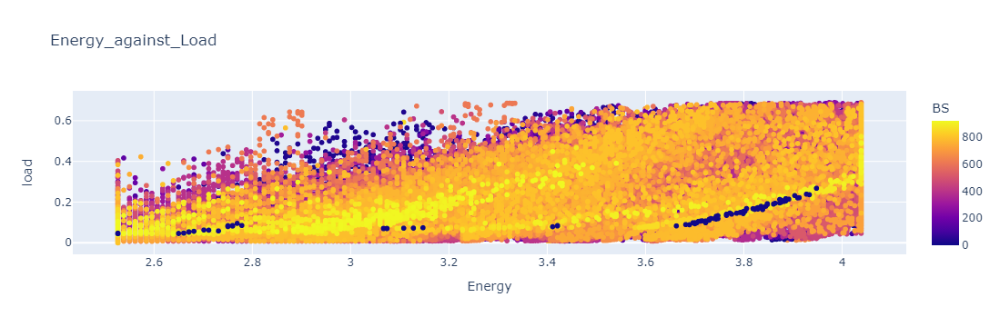

In [55]:
# Energy and load scatter plot
px.scatter(data, x="Energy", y="load", color = "BS", title = "Energy_against_Load")

In [41]:
x=data[["Time","BS","load","ESMODE","TXpower"]]  #we have more than one input
y=data["Energy"].values

In [42]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.35,random_state=40) #splitting data with test size of 35%

In [49]:
# Standard scaling
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
x_train_scaled = scaler.fit_transform(x_train)
x_test_scaled = scaler.transform(x_test)

# Assuming 'Time' is the datetime column
reference_time = pd.to_datetime('1970-01-01')

# Convert scaled features back to DataFrame
x_train_scaled_df = pd.DataFrame(x_train_scaled, columns=x_train.columns)
x_test_scaled_df = pd.DataFrame(x_test_scaled, columns=x_test.columns)


In [52]:
model=LinearRegression() #build linear regression model
# Assuming 'Time' is the datetime column
reference_time = pd.to_datetime('1970-01-01')

x_train_scaled_df['Time'] = (pd.to_datetime(x_train_scaled_df['Time']) - reference_time).dt.total_seconds()

model.fit(x_train_scaled_df,y_train) #fitting the training data

# Now, apply the same transformation to the test set
x_test_scaled_df['Time'] = (pd.to_datetime(x_test_scaled_df['Time']) - reference_time).dt.total_seconds()

predicted=model.predict(x_test_scaled_df) #testing our model’s performance

In [53]:
print("MSE", mean_squared_error(y_test,predicted))
print("R squared", metrics.r2_score(y_test,predicted))

MSE 0.07601576362053485
R squared 0.5819834782813877


### Visualization 

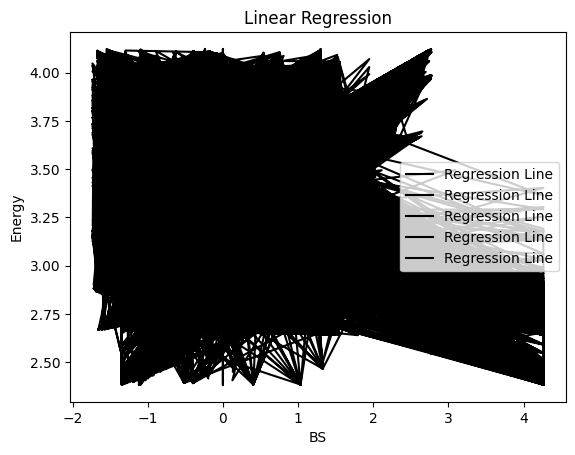

In [62]:
# Regression line
plt.plot(x_test_scaled_df, model.predict(x_test_scaled_df), color="black", label="Regression Line")

plt.title("Linear Regression")
plt.xlabel("BS")
plt.ylabel("Energy")
plt.legend()
plt.show()

In [58]:
print(len(x_test_scaled_df), len(y_test))

32421 32421
